# Graph Tutorial - Part 2: Community Detection

**Goal:** Reveal structure hidden in the connectome by grouping neurons into communities.

**Methods covered:**
- Modularity-based: Louvain, Leiden
- Inferential methods on Stochastic Block Model (SBM)
- Spectral Clustering: ASE, LSE

# PART 0: SETUP

## 0.1 Imports

In [40]:
# ▶ RUN THIS CELL: Import required libraries
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import time
import warnings
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
np.random.seed(42)

# Figure settings for presentation-quality plots
plt.rcParams['figure.figsize'] = [12, 4]
plt.rcParams['figure.dpi'] = 150
plt.rcParams['font.size'] = 16

# Import shared utilities from plots.py
from plots import (
    visualize_graph, 
    plot_adjacency_matrix, 
    nx_to_gt,  # NetworkX -> graph-tool conversion
    IPYSIGMA_AVAILABLE
)

# Check for graph-tool
try:
    import graph_tool.all as gt
    GRAPH_TOOL_AVAILABLE = True
    print('✓ graph-tool available')
    if gt.openmp_enabled():
        print(f'  OpenMP enabled: {gt.openmp_get_num_threads()} threads')
except ImportError:
    GRAPH_TOOL_AVAILABLE = False
    print('⚠️ graph-tool not available (SBM will be skipped)')

# Check for graspologic (includes Leiden, ASE, LSE)
try:
    from graspologic.embed import AdjacencySpectralEmbed, LaplacianSpectralEmbed
    from graspologic.partition import leiden
    GRASPOLOGIC_AVAILABLE = True
    print('✓ graspologic available (Leiden, ASE, LSE)')
except ImportError:
    GRASPOLOGIC_AVAILABLE = False
    print('⚠️ graspologic not available (Leiden, ASE, LSE will be skipped)')

print('✓ Imports successful!')

✓ graph-tool available
  OpenMP enabled: 16 threads
✓ graspologic available (Leiden, ASE, LSE)
✓ Imports successful!


## 0.2 Load Connectome Data

We load synapse data from the **FAFB** (Full Adult Fly Brain) dataset, specifically the **central complex** region.

In [41]:
# ▶ RUN THIS CELL: Load connectome data
import os
import pandas as pd

# Configuration
DATASET = 'fafb_783'
REGION = 'central_complex'

# Try local path first, then GCS
LOCAL_PATH = f'data/{DATASET}_{REGION}_synapses.feather'
GCS_PATH = f'gs://sjcabs_2025_data/fafb/{REGION}/{DATASET}_{REGION}_synapses.feather'
META_PATH = f'gs://sjcabs_2025_data/fafb/{REGION}/{DATASET}_{REGION}_meta.feather'

if os.path.exists(LOCAL_PATH):
    print(f'Loading from local: {LOCAL_PATH}')
    synapses_df = pd.read_feather(LOCAL_PATH)
else:
    print(f'Loading from GCS: {GCS_PATH}')
    import gcsfs
    gcs = gcsfs.GCSFileSystem(token='google_default')
    import pyarrow.feather as feather
    with gcs.open(GCS_PATH.replace('gs://', ''), 'rb') as f:
        synapses_df = feather.read_feather(f)
    with gcs.open(META_PATH.replace('gs://', ''), 'rb') as f:
        meta_df = feather.read_feather(f)

print(f'✓ Loaded {len(synapses_df):,} synapses')
print(f'  Columns: {list(synapses_df.columns)}')
synapses_df.head()


Loading from GCS: gs://sjcabs_2025_data/fafb/central_complex/fafb_783_central_complex_synapses.feather
✓ Loaded 1,820,042 synapses
  Columns: ['id', 'connector_id', 'x', 'y', 'z', 'confidence', 'syn_top_nt', 'syn_top_p', 'gaba', 'acetylcholine', 'glutamate', 'octopamine', 'serotonin', 'dopamine', 'prepost', 'pre', 'post', 'neuropil', 'pre_label', 'post_label', 'side']


,id,connector_id,x,y,z,confidence,syn_top_nt,syn_top_p,gaba,acetylcholine,...,octopamine,serotonin,dopamine,prepost,pre,post,neuropil,pre_label,post_label,side
0,37903271,8415165437,435587,268526,197920,142,dopamine,0.49,0.02,0.31,...,0.00,0.14,0.49,0,720575940602430944,720575940621854563,IPS,axon,axon,right
1,38453376,8415165437,440918,258788,197240,132,acetylcholine,0.87,0.03,0.87,...,0.01,0.02,0.07,0,720575940602430944,720575940631537735,IPS,axon,axon,right
2,133622988,4758879023,430782,250449,104440,137,acetylcholine,0.97,0.00,0.97,...,0.02,0.00,0.01,0,720575940602430944,720575940624323475,LAL,axon,unknown,right
3,171205160,8415165437,442883,253256,200480,63,acetylcholine,0.98,0.00,0.98,...,0.00,0.00,0.01,0,720575940602430944,720575940631537735,IPS,axon,axon,right
4,40090700,5005274937,560716,178635,129400,157,acetylcholine,0.97,0.00,0.97,...,0.00,0.00,0.03,0,720575940602747360,720575940613326250,FB,axon,dendrite,None


In [42]:
# ▶ RUN THIS CELL: Build NetworkX graph from synapse data

# Create directed graph from synapse data
# Each row is a synapse: pre -> post
G_connectome = nx.DiGraph()

# Add edges (multiple synapses between same neurons become edge weight)
edge_counts = synapses_df.groupby(['pre', 'post']).size().reset_index(name='weight')
for _, row in edge_counts.iterrows():
    G_connectome.add_edge(row['pre'], row['post'], weight=row['weight'])

print(f'✓ Built connectome graph')
print(f'  Nodes: {G_connectome.number_of_nodes():,}')
print(f'  Edges: {G_connectome.number_of_edges():,}')
print(f'  Density: {nx.density(G_connectome):.4f}')

# Store density for later use
CONNECTOME_DENSITY = nx.density(G_connectome)


✓ Built connectome graph
  Nodes: 10,572
  Edges: 340,036
  Density: 0.0030


In [43]:
# Add node attributes from graph structure
nx.set_node_attributes(G_connectome, dict(G_connectome.degree()), 'degree')
nx.set_node_attributes(G_connectome, dict(G_connectome.in_degree()), 'in_degree')
nx.set_node_attributes(G_connectome, dict(G_connectome.out_degree()), 'out_degree')

# Add node attributes from metadata
# Columns to include: side, hemilineage, cell_class, cell_type, neurotransmitter_prediction
META_COLUMNS = ['side', 'hemilineage', 'cell_class', 'cell_type', 'neurotransmitter_predicted']
ID_COLUMN = f'{DATASET}_id'  # e.g., 'fafb_783_id'

# Create mapping from neuron ID to metadata
meta_dict = meta_df.set_index(ID_COLUMN)[META_COLUMNS].to_dict('index')

# Add each metadata column as node attribute
n_labeled = 0
for col in META_COLUMNS:
    attr_dict = {}
    for node in G_connectome.nodes():
        if node in meta_dict:
            attr_dict[node] = meta_dict[node].get(col)
            if col == 'cell_type' and meta_dict[node].get(col) is not None:
                n_labeled += 1
        else:
            attr_dict[node] = None
    nx.set_node_attributes(G_connectome, attr_dict, col)

print(f'✓ Full connectome node attributes set:')
print(f'  Structural: degree, in_degree, out_degree')
print(f'  Metadata: {", ".join(META_COLUMNS)}')
print(f'  Neurons with cell_type labels: {n_labeled:,} / {G_connectome.number_of_nodes():,} ({n_labeled/G_connectome.number_of_nodes()*100:.1f}%)')

✓ Full connectome node attributes set:
  Structural: degree, in_degree, out_degree
  Metadata: side, hemilineage, cell_class, cell_type, neurotransmitter_predicted
  Neurons with cell_type labels: 2,779 / 10,572 (26.3%)


In [44]:
# ═══════════════════════════════════════════════════════════════════════════════
# Create subgraph with only labeled neurons (has cell_type metadata)
# This will be used for all subsequent community detection analysis
# ═══════════════════════════════════════════════════════════════════════════════

# Keep full connectome for reference
G_connectome_full = G_connectome.copy()
print(f'Full connectome: {G_connectome_full.number_of_nodes():,} neurons, {G_connectome_full.number_of_edges():,} edges')

# Filter to neurons with cell_type labels
cell_types = nx.get_node_attributes(G_connectome, 'cell_type')
labeled_nodes = [n for n in G_connectome.nodes() if cell_types.get(n) is not None]

# Create subgraph (preserves all node/edge attributes)
G_connectome = G_connectome.subgraph(labeled_nodes).copy()

# Recalculate degree attributes for the subgraph
nx.set_node_attributes(G_connectome, dict(G_connectome.degree()), 'degree')
nx.set_node_attributes(G_connectome, dict(G_connectome.in_degree()), 'in_degree')
nx.set_node_attributes(G_connectome, dict(G_connectome.out_degree()), 'out_degree')

print(f'\n✓ Created labeled-only connectome subgraph')
print(f'  Nodes: {G_connectome.number_of_nodes():,} (neurons with cell_type labels)')
print(f'  Edges: {G_connectome.number_of_edges():,}')
print(f'  Density: {nx.density(G_connectome):.4f}')

# Count unique cell types
unique_cell_types = set(cell_types[n] for n in G_connectome.nodes())
print(f'  Unique cell types: {len(unique_cell_types)}')

Full connectome: 10,572 neurons, 340,036 edges

✓ Created labeled-only connectome subgraph
  Nodes: 2,779 (neurons with cell_type labels)
  Edges: 262,983
  Density: 0.0341
  Unique cell types: 227


# PART 1: WHY COMMUNITY DETECTION?

**Goal:** Reveal structure homogeneity and heterogeneity. 

Community detection transforms a messy "hairball" into organized modules.

## 1.1 Motivation: Unsorted vs Sorted Adjacency Matrix

The same network can look completely different depending on node ordering.

Let's compare our example graph before and after sorting by community membership.

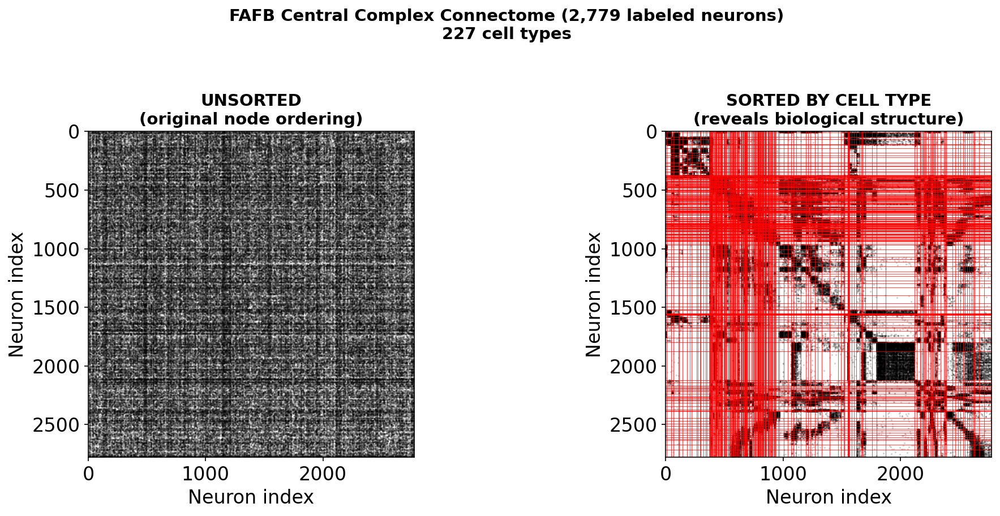

💡 KEY INSIGHT: Known cell types create block structure in the connectome!
   227 unique cell types, 226 boundaries
✓ Saved: imgs/fig_connectome_sorted_celltype.png


In [45]:
# [FIGURE] Real Connectome: Unsorted vs Sorted by Cell Type
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Get node list and adjacency matrix
connectome_nodes_temp = list(G_connectome.nodes())
A_temp = nx.adjacency_matrix(G_connectome, nodelist=connectome_nodes_temp).toarray().astype(float)

# Get cell types
cell_types = nx.get_node_attributes(G_connectome, 'cell_type')

# Left: Original ordering (by node ID)
ax = axes[0]
rows, cols = np.nonzero(A_temp)
ax.scatter(cols, rows, s=0.1, c='black', alpha=0.3)
ax.set_xlim(-0.5, len(connectome_nodes_temp)-0.5)
ax.set_ylim(len(connectome_nodes_temp)-0.5, -0.5)
ax.set_title('UNSORTED\n(original node ordering)', fontsize=14, fontweight='bold')
ax.set_xlabel('Neuron index')
ax.set_ylabel('Neuron index')
ax.set_aspect('equal')

# Right: Sorted by cell type
ax = axes[1]

# Sort nodes by cell type
nodes_with_type = [(n, cell_types[n]) for n in connectome_nodes_temp]
sorted_nodes = sorted(nodes_with_type, key=lambda x: (x[1], x[0]))
sorted_order = [n for n, _ in sorted_nodes]

# Create index mapping
node_idx_map = {n: i for i, n in enumerate(connectome_nodes_temp)}
order = [node_idx_map[n] for n in sorted_order]
A_sorted_ct = A_temp[np.ix_(order, order)]

rows, cols = np.nonzero(A_sorted_ct)
ax.scatter(cols, rows, s=0.1, c='black', alpha=0.3)
ax.set_xlim(-0.5, len(connectome_nodes_temp)-0.5)
ax.set_ylim(len(connectome_nodes_temp)-0.5, -0.5)

# Add boundaries between cell types
sorted_types = [t for _, t in sorted_nodes]
boundaries = []
prev_type = sorted_types[0]
for i, t in enumerate(sorted_types):
    if t != prev_type:
        boundaries.append(i)
        prev_type = t

for b in boundaries:
    ax.axhline(y=b-0.5, color='red', linewidth=0.5, alpha=0.7)
    ax.axvline(x=b-0.5, color='red', linewidth=0.5, alpha=0.7)

ax.set_title('SORTED BY CELL TYPE\n(reveals biological structure)', fontsize=14, fontweight='bold')
ax.set_xlabel('Neuron index')
ax.set_ylabel('Neuron index')
ax.set_aspect('equal')

# Count unique cell types
unique_types = set(sorted_types)
plt.suptitle(f'FAFB Central Complex Connectome ({len(connectome_nodes_temp):,} labeled neurons)\n{len(unique_types)} cell types', 
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('imgs/fig_connectome_sorted_celltype.png', dpi=150, bbox_inches='tight')
plt.show()

print(f'💡 KEY INSIGHT: Known cell types create block structure in the connectome!')
print(f'   {len(unique_types)} unique cell types, {len(boundaries)} boundaries')
print('✓ Saved: imgs/fig_connectome_sorted_celltype.png')

# PART 2: MODULARITY-BASED METHODS (Louvain / Leiden)

## 2.1 Modularity Equation

**Modularity** measures partition quality: how many more edges exist within communities than expected by chance?

$$Q = \sum_c \left[ \frac{m_i}{m} - \left(\frac{2m_i + e_i}{2m}\right)^2 \right]$$

Where $m_i$ = sum of edge weights within community $i$ , $e_i$ = sum of edge weights outside of community $i$, $m$ = sum of total edge weights.

**Intuition:** The term $\frac{2m_i + e_i}{2m}$ represents the **expected number of edges** under a null model where edges are randomly placed independently. A positive $Q$ means more edges exists within community than expected by chance.

**Interpretation:**
- $Q > 0$: More within-community edges than expected (assortative structure)
- $Q \approx 0$: Random placement (no community structure)
- $Q < 0$: Fewer within-community edges than expected (disassortative structure)

In [46]:
# ═══════════════════════════════════════════════════════════════════════════════
# HYPERPARAMETERS: Example Graph
# ═══════════════════════════════════════════════════════════════════════════════
RANDOM_SEED = 42

# Louvain / Leiden
LOUVAIN_RESOLUTION = 1.0  # Higher = more communities
LEIDEN_RESOLUTION = 1.0

print('✓ Hyperparameters set')

✓ Hyperparameters set


In [47]:
# ═══════════════════════════════════════════════════════════════════════════════
# METHOD 1: Louvain & Leiden
# ═══════════════════════════════════════════════════════════════════════════════
# NOTE: Both methods require UNDIRECTED graphs for modularity optimization.
# We convert directed → undirected using G.to_undirected(), which:
#   - Makes edges bidirectional
#   - For reciprocal edges (i→j and j→i), keeps ONE weight (not sum)
# ═══════════════════════════════════════════════════════════════════════════════

def run_louvain(G, resolution=LOUVAIN_RESOLUTION, seed=RANDOM_SEED, verbose=True):
    """
    Run Louvain community detection (NetworkX implementation).
    
    Parameters
    ----------
    G : nx.Graph or nx.DiGraph
        Input graph. If directed, converted to undirected via G.to_undirected().
    resolution : float
        Resolution parameter. Higher = more communities.
    seed : int
        Random seed for reproducibility.
    
    Returns
    -------
    communities : list of sets
    modularity : float
    info : dict
    """
    # Convert to undirected (modularity is defined for undirected graphs)
    if G.is_directed():
        G_undirected = G.to_undirected()
        converted = True
    else:
        G_undirected = G
        converted = False
    
    start = time.time()
    communities = list(nx.community.louvain_communities(
        G_undirected, seed=seed, resolution=resolution))
    Q = nx.community.modularity(G_undirected, communities)
    elapsed = time.time() - start
    
    if verbose:
        print(f'LOUVAIN (resolution={resolution})')
        if converted:
            print(f'  [Converted to undirected: {G_undirected.number_of_edges():,} edges]')
        print(f'  Communities: {len(communities)}, Q={Q:.3f}, Time: {elapsed:.1f}s')
        sizes = sorted([len(c) for c in communities], reverse=True)
        print(f'  Sizes: {sizes[:5]}{"..." if len(sizes) > 5 else ""}')
    
    return communities, Q, {'time': elapsed, 'resolution': resolution}


def run_leiden(G, resolution=LEIDEN_RESOLUTION, seed=RANDOM_SEED, verbose=True):
    """
    Run Leiden community detection (graspologic implementation).
    
    Parameters
    ----------
    G : nx.Graph or nx.DiGraph
        Input graph. If directed, converted to undirected via G.to_undirected().
    resolution : float
        Resolution parameter. Higher = more communities.
    seed : int
        Random seed for reproducibility.
    
    Returns
    -------
    communities : list of sets
    modularity : float
    info : dict
    """
    if not GRASPOLOGIC_AVAILABLE:
        raise ImportError("graspologic not available")
    
    # Convert to undirected (modularity is defined for undirected graphs)
    if G.is_directed():
        G_undirected = G.to_undirected()
        converted = True
    else:
        G_undirected = G
        converted = False
    
    node_list = list(G.nodes())
    
    start = time.time()
    
    # Pass NetworkX graph directly (not adjacency matrix) to preserve node IDs
    # and handle weighted edges correctly
    result = leiden(G_undirected, resolution=resolution, random_seed=seed)
    
    # result is a dict: {node_id: community_label}
    # Convert to list of sets
    n_comms = max(result.values()) + 1
    communities = [set() for _ in range(n_comms)]
    for node, label in result.items():
        communities[label].add(node)
    communities = [c for c in communities if len(c) > 0]
    
    # Handle isolate nodes (not in the partition) - assign each to its own community
    nodes_in_partition = set(result.keys())
    isolates = set(node_list) - nodes_in_partition
    if isolates:
        for node in isolates:
            communities.append({node})
    
    # Check for degenerate case (all singletons)
    if len(communities) == len(node_list):
        elapsed = time.time() - start
        if verbose:
            print(f'LEIDEN (resolution={resolution})')
            if converted:
                print(f'  [Converted to undirected: {G_undirected.number_of_edges():,} edges]')
            print(f'  ⚠️ Degenerate: all {len(communities)} nodes in separate communities')
            print(f'  Skipping modularity calculation (invalid partition)')
        return communities, np.nan, {'time': elapsed, 'resolution': resolution, 'degenerate': True}
    
    Q = nx.community.modularity(G_undirected, communities)
    elapsed = time.time() - start
    
    if verbose:
        print(f'LEIDEN (resolution={resolution})')
        if converted:
            print(f'  [Converted to undirected: {G_undirected.number_of_edges():,} edges]')
        print(f'  Communities: {len(communities)}, Q={Q:.3f}, Time: {elapsed:.1f}s')
        sizes = sorted([len(c) for c in communities], reverse=True)
        print(f'  Sizes: {sizes[:5]}{"..." if len(sizes) > 5 else ""}')
        if isolates:
            print(f'  Note: {len(isolates)} isolate nodes added to separate communities')
    
    return communities, Q, {'time': elapsed, 'resolution': resolution}


print('✓ Louvain and Leiden functions defined')
print('  Note: Both convert directed graphs to undirected for modularity optimization')

✓ Louvain and Leiden functions defined
  Note: Both convert directed graphs to undirected for modularity optimization


## 2.2 Resolution Parameter

The resolution parameter $\gamma$ modifies the modularity equation:

$$Q = \sum_c \left[ \frac{m_i}{m} - \gamma \cdot \left(\frac{2m_i + e_i}{2m}\right)^2 \right]$$

**What γ does:**

The term compares **observed** vs **expected** edges:

- **γ = 1** (default): Standard modularity. "Are there more edges than expected by chance?"
- **γ < 1**: Underweight null expectation → small excess looks significant → **fewer, larger communities**
- **γ > 1**: Overweight null expectation → need bigger excess → **more, smaller communities**

## 2.3 Run Louvain/Leiden on Connectome

Now let's apply modularity-based methods to the real connectome.

In [72]:
# Initialize results DataFrame to accumulate results from each method
import pandas as pd

results_df = pd.DataFrame(columns=['Method', 'Communities', 'Modularity', 'Largest', 'Smallest', 'Time'])

# Prepare connectome adjacency matrix (used by spectral methods)
connectome_nodes = list(G_connectome.nodes())
A_connectome = nx.adjacency_matrix(G_connectome, nodelist=connectome_nodes).toarray().astype(float)

print(f'Connectome: {G_connectome.number_of_nodes():,} neurons, {G_connectome.number_of_edges():,} connections')
print('✓ Results DataFrame initialized')

Connectome: 2,779 neurons, 262,983 connections
✓ Results DataFrame initialized


In [73]:
# ═══════════════════════════════════════════════════════════════════════════════
# Run Louvain on connectome
# ═══════════════════════════════════════════════════════════════════════════════
print('LOUVAIN: FAFB Central Complex Connectome')
print('=' * 60)

louvain_comms, louvain_Q, louvain_info = run_louvain(G_connectome, verbose=True)

# Add to results DataFrame
sizes = sorted([len(c) for c in louvain_comms], reverse=True)
results_df.loc[len(results_df)] = ['Louvain', len(louvain_comms), louvain_Q,
                                    sizes[0], sizes[-1], louvain_info['time']]

# Store communities as node attribute
node_to_comm = {}
for comm_id, comm in enumerate(louvain_comms):
    for node in comm:
        node_to_comm[node] = comm_id
nx.set_node_attributes(G_connectome, node_to_comm, 'community_louvain')

print(f'\n✓ Community labels stored as node attribute: community_louvain')

LOUVAIN: FAFB Central Complex Connectome
LOUVAIN (resolution=1.0)
  [Converted to undirected: 212,388 edges]
  Communities: 10, Q=0.547, Time: 1.0s
  Sizes: [548, 481, 392, 372, 351]...

✓ Community labels stored as node attribute: community_louvain


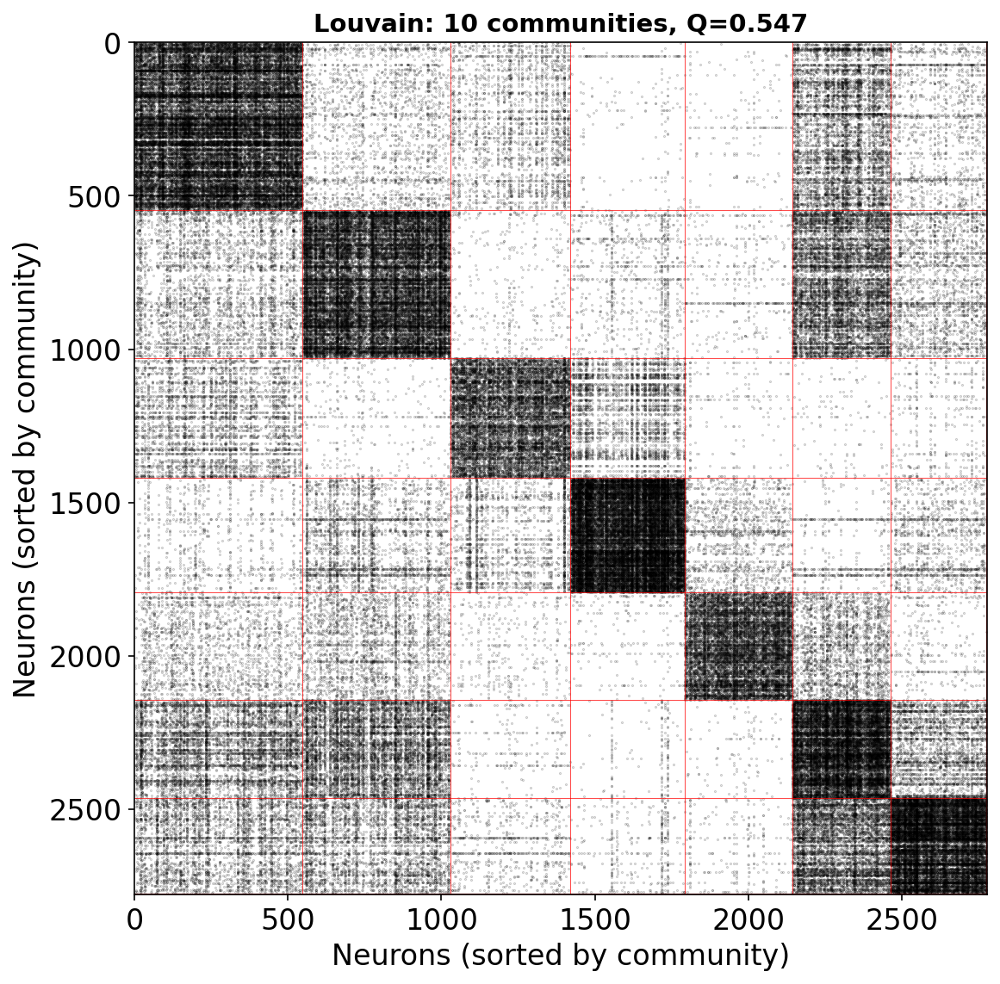

10 communities, 9 boundary lines
Sizes (largest first): [548, 481, 392, 372, 351, 321, 311, 1, 1, 1]
✓ Saved: imgs/fig_connectome_louvain.png


In [50]:
# [FIGURE] Louvain: Adjacency matrix sorted by community
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

# Sort nodes by community (largest communities first)
sorted_communities = sorted(enumerate(louvain_comms), key=lambda x: -len(x[1]))
ordered_nodes = []
for _, comm in sorted_communities:
    ordered_nodes.extend(sorted(list(comm)))

# Create reordered adjacency matrix
node_idx_map = {n: i for i, n in enumerate(connectome_nodes)}
order = [node_idx_map[n] for n in ordered_nodes]
A_reordered = A_connectome[np.ix_(order, order)]

# Plot as sparse matrix
rows, cols = np.nonzero(A_reordered)
ax.scatter(cols, rows, s=0.1, c='black', alpha=0.3)
ax.set_xlim(-0.5, len(ordered_nodes)-0.5)
ax.set_ylim(len(ordered_nodes)-0.5, -0.5)

# Add community boundaries (N-1 lines for N communities)
n_communities = len(sorted_communities)
cumsum = 0
for i, (_, comm) in enumerate(sorted_communities[:-1]):  # Skip last community
    cumsum += len(comm)
    ax.axhline(y=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)
    ax.axvline(x=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)

ax.set_title(f'Louvain: {n_communities} communities, Q={louvain_Q:.3f}', fontsize=14, fontweight='bold')
ax.set_xlabel('Neurons (sorted by community)')
ax.set_ylabel('Neurons (sorted by community)')
ax.set_aspect('equal')

plt.tight_layout()
plt.savefig('imgs/fig_connectome_louvain.png', dpi=150, bbox_inches='tight')
plt.show()

# Print community sizes
sizes = [len(c) for _, c in sorted_communities]
print(f'{n_communities} communities, {n_communities - 1} boundary lines')
print(f'Sizes (largest first): {sizes}')
print('✓ Saved: imgs/fig_connectome_louvain.png')

In [51]:
# ═══════════════════════════════════════════════════════════════════════════════
# Run Leiden on connectome
# ═══════════════════════════════════════════════════════════════════════════════
if GRASPOLOGIC_AVAILABLE:
    print('LEIDEN: FAFB Central Complex Connectome')
    print('=' * 60)

    leiden_comms, leiden_Q, leiden_info = run_leiden(G_connectome, verbose=True)

    # Only add to results if not degenerate
    if not leiden_info.get('degenerate', False):
        sizes = sorted([len(c) for c in leiden_comms], reverse=True)
        results_df.loc[len(results_df)] = ['Leiden', len(leiden_comms), leiden_Q,
                                            sizes[0], sizes[-1], leiden_info['time']]

        # Store communities as node attribute
        node_to_comm = {}
        for comm_id, comm in enumerate(leiden_comms):
            for node in comm:
                node_to_comm[node] = comm_id
        nx.set_node_attributes(G_connectome, node_to_comm, 'community_leiden')

        print(f'\n✓ Community labels stored as node attribute: community_leiden')
    else:
        print(f'\n⚠️ Leiden produced degenerate partition - skipping')
        print(f'   Try lower resolution (e.g., 0.01) for dense networks')
        leiden_comms = None  # Mark as failed
else:
    print('⚠️ graspologic not available - skipping Leiden')
    leiden_comms = None

LEIDEN: FAFB Central Complex Connectome
LEIDEN (resolution=1.0)
  [Converted to undirected: 212,388 edges]
  Communities: 9, Q=0.557, Time: 0.3s
  Sizes: [717, 481, 479, 437, 348]...
  Note: 3 isolate nodes added to separate communities

✓ Community labels stored as node attribute: community_leiden


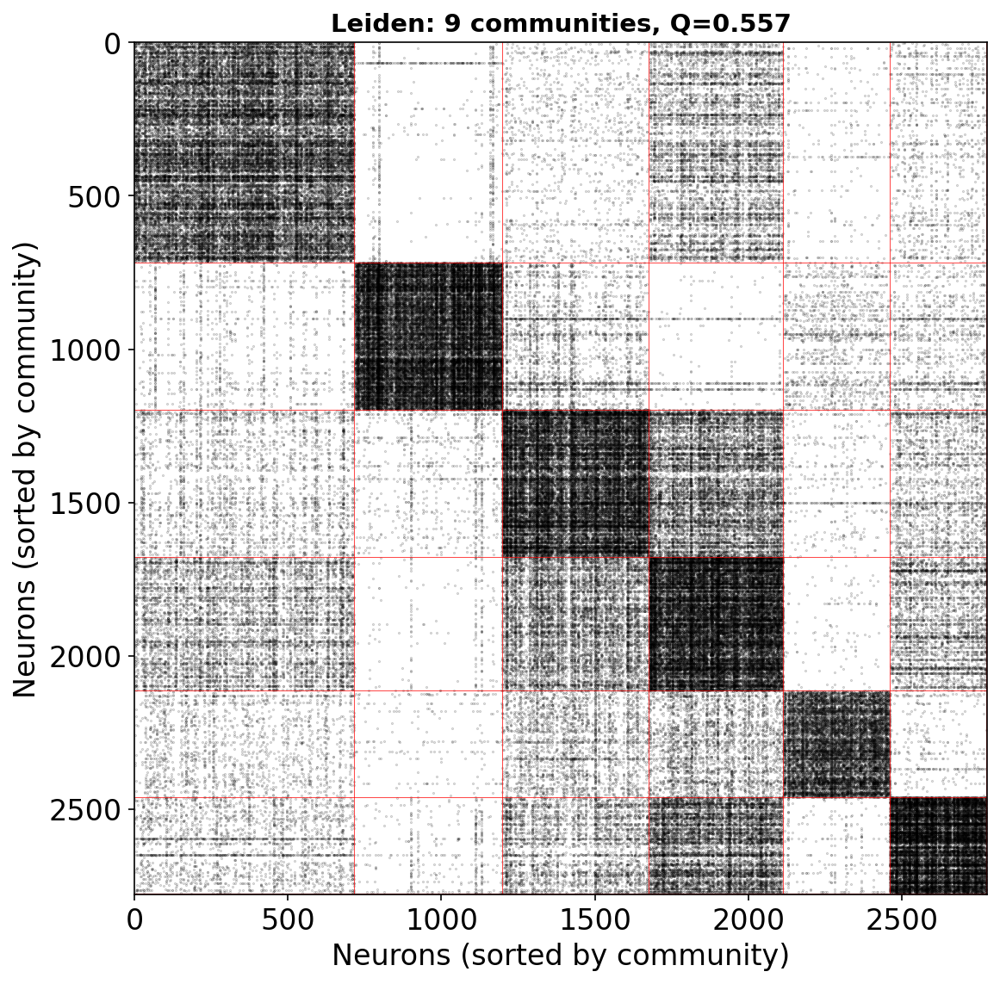

9 communities, 8 boundary lines
Sizes (largest first): [717, 481, 479, 437, 348, 314, 1, 1, 1]
✓ Saved: imgs/fig_connectome_leiden.png


In [52]:
# [FIGURE] Leiden: Adjacency matrix sorted by community
if leiden_comms is not None:
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))

    # Sort nodes by community (largest communities first)
    sorted_communities = sorted(enumerate(leiden_comms), key=lambda x: -len(x[1]))
    ordered_nodes = []
    for _, comm in sorted_communities:
        ordered_nodes.extend(sorted(list(comm)))

    # Create reordered adjacency matrix
    node_idx_map = {n: i for i, n in enumerate(connectome_nodes)}
    order = [node_idx_map[n] for n in ordered_nodes]
    A_reordered = A_connectome[np.ix_(order, order)]

    # Plot as sparse matrix
    rows, cols = np.nonzero(A_reordered)
    ax.scatter(cols, rows, s=0.1, c='black', alpha=0.3)
    ax.set_xlim(-0.5, len(ordered_nodes)-0.5)
    ax.set_ylim(len(ordered_nodes)-0.5, -0.5)

    # Add community boundaries (N-1 lines for N communities)
    n_communities = len(sorted_communities)
    cumsum = 0
    for i, (_, comm) in enumerate(sorted_communities[:-1]):  # Skip last community
        cumsum += len(comm)
        ax.axhline(y=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)
        ax.axvline(x=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)

    ax.set_title(f'Leiden: {n_communities} communities, Q={leiden_Q:.3f}', fontsize=14, fontweight='bold')
    ax.set_xlabel('Neurons (sorted by community)')
    ax.set_ylabel('Neurons (sorted by community)')
    ax.set_aspect('equal')

    plt.tight_layout()
    plt.savefig('imgs/fig_connectome_leiden.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # Print community sizes
    sizes = [len(c) for _, c in sorted_communities]
    print(f'{n_communities} communities, {n_communities - 1} boundary lines')
    print(f'Sizes (largest first): {sizes}')
    print('✓ Saved: imgs/fig_connectome_leiden.png')
else:
    print('⚠️ Leiden skipped (degenerate partition)')

## 2.4 Caveat: Assortative vs Disassortative Structure

**Modularity has a fundamental limitation:** It assumes communities are **assortative** (more edges within than between).

- **Assortative:** Dense diagonal blocks (typical "communities")
- **Disassortative:** Dense off-diagonal blocks (feedforward, core-periphery)

⚠️ **Modularity-based methods will fail on disassortative networks!**

CONCEPT: Assortative vs Disassortative Community Structure

ASORTATIVE Network:
  Internal edges: 49 (94%)
  External edges: 3 (6%)

DISASORTATIVE Network:
  Internal edges: 6 (9%)
  External edges: 59 (91%)


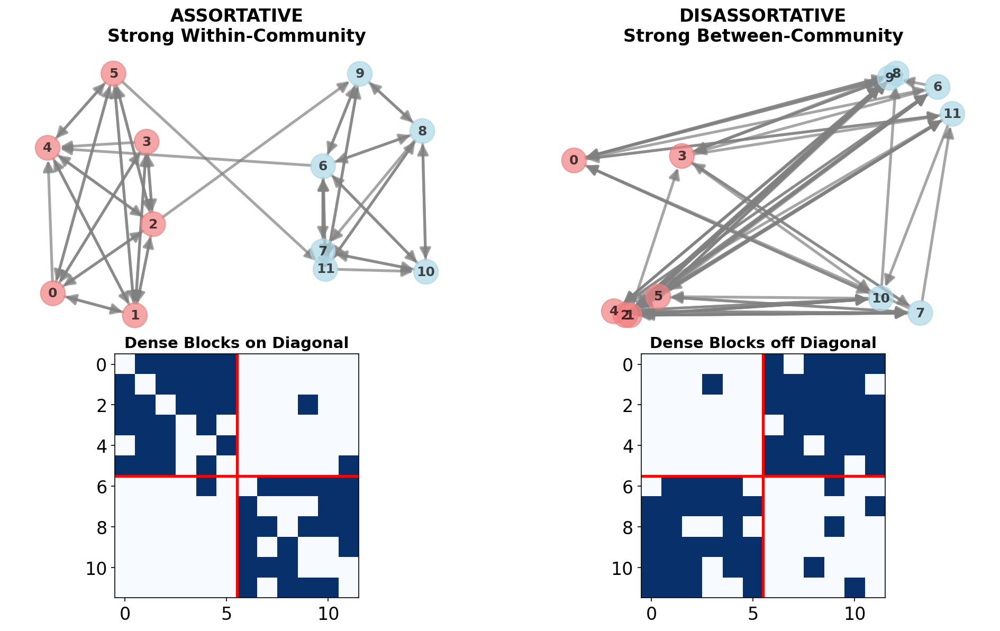


💡 KEY INSIGHT:
   ASSORTATIVE: Modularity works well (high Q)
   DISASSORTATIVE: Modularity fails (low/negative Q)
   → Use SBM for disassortative structure!


In [53]:
# [FIGURE] Illustration: Assortative vs Disassortative Communities
print('CONCEPT: Assortative vs Disassortative Community Structure')
print('=' * 60)

# Create two simple example networks
np.random.seed(123)

# ASSORTATIVE: High within-community, low between-community connections
P_assortative = np.array([
    [0.8, 0.1],  # Community 0: 80% internal, 10% to other
    [0.1, 0.8],  # Community 1: 10% from other, 80% internal
])

# DISASSORTATIVE: Low within-community, high between-community connections  
P_disassortative = np.array([
    [0.2, 0.7],  # Community 0: 20% internal, 70% to other
    [0.7, 0.2],  # Community 1: 70% from other, 20% internal
])

def generate_community_network(P_matrix, comm_size=6, seed=123):
    """Generate a directed network from community probability matrix"""
    np.random.seed(seed)
    n_comm = len(P_matrix)
    n_nodes = n_comm * comm_size
    
    A = np.zeros((n_nodes, n_nodes))
    node_to_comm = {}
    
    for i in range(n_nodes):
        node_to_comm[i] = i // comm_size
    
    for i in range(n_nodes):
        for j in range(n_nodes):
            if i != j:
                comm_i = node_to_comm[i]
                comm_j = node_to_comm[j]
                prob = P_matrix[comm_i, comm_j]
                if np.random.rand() < prob:
                    A[i, j] = 1
    
    return A, node_to_comm

# Generate networks
A_assort, node_to_comm_assort = generate_community_network(P_assortative, comm_size=6)
A_disassort, node_to_comm_disassort = generate_community_network(P_disassortative, comm_size=6)

# Create NetworkX graphs
G_assort = nx.DiGraph(A_assort)
G_disassort = nx.DiGraph(A_disassort)

# Count internal vs external edges
def count_edge_types(A, node_to_comm):
    internal = external = 0
    for i in range(len(A)):
        for j in range(len(A)):
            if A[i, j] > 0:
                if node_to_comm[i] == node_to_comm[j]:
                    internal += 1
                else:
                    external += 1
    return internal, external

internal_assort, external_assort = count_edge_types(A_assort, node_to_comm_assort)
internal_disassort, external_disassort = count_edge_types(A_disassort, node_to_comm_disassort)

print(f'\nASORTATIVE Network:')
print(f'  Internal edges: {internal_assort} ({internal_assort/(internal_assort+external_assort)*100:.0f}%)')
print(f'  External edges: {external_assort} ({external_assort/(internal_assort+external_assort)*100:.0f}%)')

print(f'\nDISASORTATIVE Network:')
print(f'  Internal edges: {internal_disassort} ({internal_disassort/(internal_disassort+external_disassort)*100:.0f}%)')
print(f'  External edges: {external_disassort} ({external_disassort/(internal_disassort+external_disassort)*100:.0f}%)')

# Visualize
fig = plt.figure(figsize=(16, 9))
gs = fig.add_gridspec(2, 2, height_ratios=[1.2, 1], hspace=0.05, wspace=0.15)

ax_graph_assort = fig.add_subplot(gs[0, 0])
ax_graph_disassort = fig.add_subplot(gs[0, 1])
ax_matrix_assort = fig.add_subplot(gs[1, 0])
ax_matrix_disassort = fig.add_subplot(gs[1, 1])

colors = ['lightcoral', 'lightblue']

def community_layout(G, node_to_comm):
    pos = {}
    comm_positions = {0: (-1, 0), 1: (1, 0)}
    for node in G.nodes():
        comm = node_to_comm[node]
        center = comm_positions[comm]
        angle = np.random.uniform(0, 2*np.pi)
        pos[node] = (center[0] + 0.4*np.cos(angle), center[1] + 0.4*np.sin(angle))
    return pos

pos_assort = community_layout(G_assort, node_to_comm_assort)
pos_disassort = community_layout(G_disassort, node_to_comm_disassort)

# ASSORTATIVE Graph
node_colors_assort = [colors[node_to_comm_assort[n]] for n in G_assort.nodes()]
nx.draw(G_assort, pos_assort, ax=ax_graph_assort, node_color=node_colors_assort,
       node_size=500, with_labels=True, font_size=12, font_weight='bold',
       edge_color='gray', alpha=0.7, arrows=True, arrowsize=20, width=2.5)
ax_graph_assort.set_title('ASSORTATIVE\nStrong Within-Community', fontsize=16, fontweight='bold')

# DISASSORTATIVE Graph
node_colors_disassort = [colors[node_to_comm_disassort[n]] for n in G_disassort.nodes()]
nx.draw(G_disassort, pos_disassort, ax=ax_graph_disassort, node_color=node_colors_disassort,
       node_size=500, with_labels=True, font_size=12, font_weight='bold',
       edge_color='gray', alpha=0.7, arrows=True, arrowsize=20, width=2.5)
ax_graph_disassort.set_title('DISASSORTATIVE\nStrong Between-Community', fontsize=16, fontweight='bold')

# ASSORTATIVE Matrix
ax_matrix_assort.imshow(A_assort, cmap='Blues', aspect='equal')
ax_matrix_assort.axhline(y=5.5, color='red', linewidth=2.5)
ax_matrix_assort.axvline(x=5.5, color='red', linewidth=2.5)
ax_matrix_assort.set_title('Dense Blocks on Diagonal', fontsize=14, fontweight='bold')

# DISASSORTATIVE Matrix
ax_matrix_disassort.imshow(A_disassort, cmap='Blues', aspect='equal')
ax_matrix_disassort.axhline(y=5.5, color='red', linewidth=2.5)
ax_matrix_disassort.axvline(x=5.5, color='red', linewidth=2.5)
ax_matrix_disassort.set_title('Dense Blocks off Diagonal', fontsize=14, fontweight='bold')

plt.savefig('imgs/fig_assortative_vs_disassortative.png', dpi=150, bbox_inches='tight')
plt.show()

print('\n💡 KEY INSIGHT:')
print('   ASSORTATIVE: Modularity works well (high Q)')
print('   DISASSORTATIVE: Modularity fails (low/negative Q)')
print('   → Use SBM for disassortative structure!')
print('=' * 60)

# PART 3: STOCHASTIC BLOCK MODEL (SBM)

The SBM is a **generative model** that explicitly models block structure:

$$P(A_{ij} = 1) = B_{k\ell} \quad \text{where } k = \text{block}(i), \ell = \text{block}(j)$$

**Advantages over modularity** - Can detect both assortative AND disassortative structure

## Variation 1: Degree-Corrected SBM

Real networks have **degree heterogeneity** (hubs and peripheral nodes within the same community).

The degree-corrected SBM adds node-specific degree propensities:

$$P(A_{ij}) = \theta_i \theta_j B_{k\ell}$$

where $\theta_i$ captures node $i$'s degree tendency.

**Recommendation:** Always use `deg_corr=True` for real networks.

## Variation 2: Nested SBM

The **nested SBM** builds a hierarchy of block models:
- No need to specify number of communities (auto-determined via MDL principle)
- Reveals multi-scale structure

We use `graph-tool`'s implementations for efficient inference.

In [54]:
# SBM (graph-tool)
SBM_DEG_CORR = False
SBM_NESTED = False
SBM_MCMC_SWEEPS = 10

In [55]:
# ═══════════════════════════════════════════════════════════════════════════════
# METHOD 2: Stochastic Block Model (graph-tool)
# ═══════════════════════════════════════════════════════════════════════════════

def run_sbm(G, nested=SBM_NESTED, deg_corr=SBM_DEG_CORR, 
            mcmc_sweeps=SBM_MCMC_SWEEPS, verbose=True):
    """
    Run Stochastic Block Model using graph-tool.
    
    Parameters
    ----------
    G : nx.DiGraph
        Input graph
    nested : bool
        Use nested (hierarchical) SBM. Auto-determines number of communities.
    deg_corr : bool
        Use degree-corrected model. Recommended for real networks.
    mcmc_sweeps : int
        Number of MCMC refinement sweeps.
    
    Returns
    -------
    communities : list of sets
    modularity : float
    info : dict (includes 'state', 'entropy', 'n_levels' for nested)
    """
    if not GRAPH_TOOL_AVAILABLE:
        raise ImportError("graph-tool not available")
    
    G_undirected = G.to_undirected() if G.is_directed() else G
    
    start = time.time()
    
    # Convert to graph-tool using shared utility
    G_gt, node_map = nx_to_gt(G)
    node_list = list(G.nodes())
    
    sbm_type = 'Nested' if nested else 'Flat'
    if verbose:
        print(f'SBM ({sbm_type}, deg_corr={deg_corr})')
    
    # Fit SBM
    if nested:
        state = gt.minimize_nested_blockmodel_dl(
            G_gt, state_args=dict(deg_corr=deg_corr))
        levels = state.get_levels()
        block_property = levels[0].get_blocks()
    else:
        state = gt.minimize_blockmodel_dl(
            G_gt, state_args=dict(deg_corr=deg_corr))
        block_property = state.get_blocks()
    
    entropy = state.entropy()
    
    # Optional MCMC refinement
    if mcmc_sweeps > 0:
        for _ in range(mcmc_sweeps):
            state.multiflip_mcmc_sweep(niter=1)
        if nested:
            levels = state.get_levels()
            block_property = levels[0].get_blocks()
        else:
            block_property = state.get_blocks()
    
    # Extract communities
    sbm_labels = [block_property[v] for v in range(G_gt.num_vertices())]
    n_blocks = max(sbm_labels) + 1
    communities = [set() for _ in range(n_blocks)]
    for idx, block_id in enumerate(sbm_labels):
        communities[block_id].add(node_list[idx])
    communities = [c for c in communities if len(c) > 0]
    
    Q = nx.community.modularity(G_undirected, communities)
    elapsed = time.time() - start
    
    info = {'time': elapsed, 'entropy': entropy, 'state': state, 
            'nested': nested, 'deg_corr': deg_corr}
    if nested:
        info['n_levels'] = len(state.get_levels())
    
    if verbose:
        print(f'  Communities: {len(communities)}, Q={Q:.3f}, Time: {elapsed:.1f}s')
        sizes = sorted([len(c) for c in communities], reverse=True)
        print(f'  Sizes: {sizes[:5]}{"..." if len(sizes) > 5 else ""}')
        print(f'  Description length: {entropy:.1f}')
        if nested:
            print(f'  Hierarchy levels: {info["n_levels"]}')
    
    return communities, Q, info


print('✓ SBM function defined (uses nx_to_gt from plots.py)')

✓ SBM function defined (uses nx_to_gt from plots.py)


## 3.3 Run SBM on Connectome

In [56]:
# ═══════════════════════════════════════════════════════════════════════════════
# Run SBM on connectome
# ═══════════════════════════════════════════════════════════════════════════════
if GRAPH_TOOL_AVAILABLE:
    print('SBM: FAFB Central Complex Connectome')
    print('=' * 60)
    
    # Store all SBM results
    sbm_results = {}
    
    # Plain SBM (no degree correction, no nesting)
    print('\nPlain SBM')
    print('-' * 40)
    sbm_comms_plain, sbm_Q_plain, sbm_info_plain = run_sbm(
        G_connectome, nested=False, deg_corr=False, verbose=True)
    sbm_results['SBM'] = {
        'comms': sbm_comms_plain, 'Q': sbm_Q_plain, 'info': sbm_info_plain}
    
    # Add to results DataFrame
    for name, res in sbm_results.items():
        sizes = sorted([len(c) for c in res['comms']], reverse=True)
        results_df.loc[len(results_df)] = [name, len(res['comms']), res['Q'],
                                            sizes[0], sizes[-1], res['info']['time']]
    
    # Store as node attribute
    node_to_comm = {}
    for comm_id, comm in enumerate(sbm_comms_plain):
        for node in comm:
            node_to_comm[node] = comm_id
    nx.set_node_attributes(G_connectome, node_to_comm, 'community_sbm')
    
    print('\n✓ Community labels stored as node attribute: community_sbm')
else:
    print('⚠️ graph-tool not available - skipping SBM')

SBM: FAFB Central Complex Connectome

Plain SBM
----------------------------------------
SBM (Flat, deg_corr=False)
  Communities: 105, Q=0.111, Time: 12.2s
  Sizes: [104, 99, 92, 75, 61]...
  Description length: 691209.0

✓ Community labels stored as node attribute: community_sbm


In [57]:
# ═══════════════════════════════════════════════════════════════════════════════
# EXERCISE: Try DC-SBM and Nested DC-SBM
# ═══════════════════════════════════════════════════════════════════════════════
# The Degree-Corrected SBM (DC-SBM) accounts for degree heterogeneity within blocks,
# making it more suitable for real networks where nodes have varying connectivity.
#
# The Nested DC-SBM builds a hierarchy of block models and automatically determines
# the number of communities using the Minimum Description Length (MDL) principle.
#
# TODO: Uncomment and run the following to compare all SBM variants:
#
# if GRAPH_TOOL_AVAILABLE:
#     # Degree-Corrected SBM
#     print('DC-SBM')
#     print('-' * 40)
#     dc_sbm_comms, dc_sbm_Q, dc_sbm_info = run_sbm(
#         G_connectome, nested=False, deg_corr=True, verbose=True)
#     sbm_results['DC-SBM'] = {
#         'comms': dc_sbm_comms, 'Q': dc_sbm_Q, 'info': dc_sbm_info}
#     
#     # Nested Degree-Corrected SBM
#     print('\nNested DC-SBM')
#     print('-' * 40)
#     nested_sbm_comms, nested_sbm_Q, nested_sbm_info = run_sbm(
#         G_connectome, nested=True, deg_corr=True, verbose=True)
#     sbm_results['Nested DC-SBM'] = {
#         'comms': nested_sbm_comms, 'Q': nested_sbm_Q, 'info': nested_sbm_info}
#     
#     # Compare results
#     print('\n' + '=' * 60)
#     print('SBM COMPARISON')
#     print('=' * 60)
#     for name, res in sbm_results.items():
#         print(f"{name}: {len(res['comms'])} communities, Q={res['Q']:.4f}")

print('Exercise: Uncomment the code above to run DC-SBM and Nested DC-SBM')

Exercise: Uncomment the code above to run DC-SBM and Nested DC-SBM


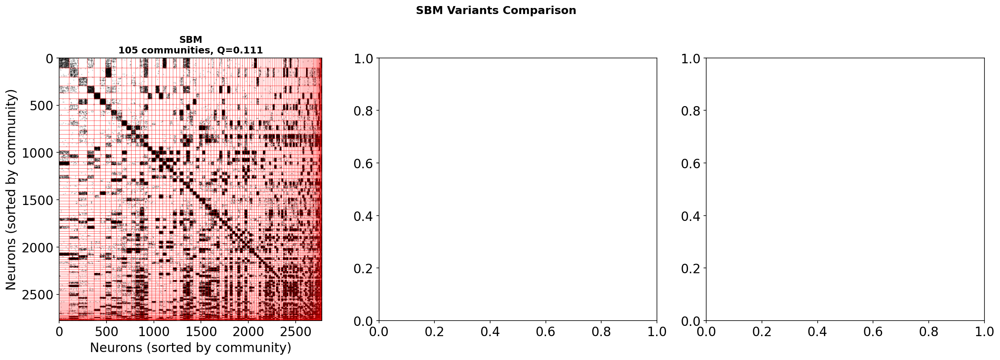

✓ Saved: imgs/fig_sbm_comparison.png


In [58]:
# [FIGURE] SBM Comparison: Adjacency matrices sorted by community
if GRAPH_TOOL_AVAILABLE and 'sbm_results' in dir():
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    for ax, (name, res) in zip(axes, sbm_results.items()):
        comms = res['comms']
        Q = res['Q']
        
        # Sort nodes by community (largest communities first)
        sorted_communities = sorted(enumerate(comms), key=lambda x: -len(x[1]))
        ordered_nodes = []
        for _, comm in sorted_communities:
            ordered_nodes.extend(sorted(list(comm)))
        
        # Create reordered adjacency matrix
        node_idx_map = {n: i for i, n in enumerate(connectome_nodes)}
        order = [node_idx_map[n] for n in ordered_nodes]
        A_reordered = A_connectome[np.ix_(order, order)]
        
        # Plot as sparse matrix
        rows, cols = np.nonzero(A_reordered)
        ax.scatter(cols, rows, s=0.1, c='black', alpha=0.3)
        ax.set_xlim(-0.5, len(ordered_nodes)-0.5)
        ax.set_ylim(len(ordered_nodes)-0.5, -0.5)
        
        # Add community boundaries
        cumsum = 0
        for i, (_, comm) in enumerate(sorted_communities[:-1]):  # Skip last community
            cumsum += len(comm)
            ax.axhline(y=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)
            ax.axvline(x=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)
        
        n_levels = res['info'].get('n_levels', 1)
        level_str = f", {n_levels} levels" if n_levels > 1 else ""
        ax.set_title(f'{name}\n{len(comms)} communities, Q={Q:.3f}{level_str}', 
                     fontsize=12, fontweight='bold')
        ax.set_xlabel('Neurons (sorted by community)')
        ax.set_ylabel('Neurons (sorted by community)')
        ax.set_aspect('equal')
    
    plt.suptitle('SBM Variants Comparison', fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig('imgs/fig_sbm_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('✓ Saved: imgs/fig_sbm_comparison.png')
else:
    print('⚠️ SBM skipped (graph-tool not available)')

---
# PART 4: SPECTRAL CLUSTERING

**Two-step approach:**
1. **Embed:** $A \xrightarrow{\text{SVD}} \hat{X}$ (n × d matrix)
2. **Cluster:** $\hat{X} \xrightarrow{\text{K-means / GMM}}$ labels


**Choosing d (embedding dimension):** Use the elbow method on singular values.

**Choosing k (number of clusters):** Options:
- Match to another method's k
- Use domain knowledge
- Grid search

In [59]:
unique_types = set(v for v in cell_types.values() if v is not None)
SPECTRAL_N_CLUSTERS = len(unique_types)
print(f'Using {SPECTRAL_N_CLUSTERS} clusters for spectral methods based on cell types')

SPECTRAL_N_COMPONENTS = None
SPECTRAL_N_ELBOWS = 2
SPECTRAL_KMEANS_INIT = SPECTRAL_N_CLUSTERS
LSE_FORM = 'DAD'  # 'DAD', 'R-DAD', 'I-DAD'

Using 227 clusters for spectral methods based on cell types


## 4.1 ASE vs LSE

![Spectral Embedding Overview](imgs/pnas.1814462116fig01.jpeg)

*Figure: Overview of spectral embedding methods for network analysis. Source: [Priebe et al., PNAS 2019](https://www.pnas.org/doi/10.1073/pnas.1814462116)*

In [60]:
# ═══════════════════════════════════════════════════════════════════════════════
# METHOD 3: Spectral Clustering (ASE / LSE)
# ═══════════════════════════════════════════════════════════════════════════════
from sklearn.cluster import KMeans
from graspologic.utils import pass_to_ranks

def run_ase(G, A=None, n_clusters=SPECTRAL_N_CLUSTERS, n_components=SPECTRAL_N_COMPONENTS, 
            n_elbows=SPECTRAL_N_ELBOWS, seed=RANDOM_SEED, verbose=True):
    """
    Run Adjacency Spectral Embedding + K-means clustering.
    Uses pass-to-ranks normalization for robustness.
    
    Parameters
    ----------
    G : nx.DiGraph
        Input graph
    A : np.ndarray, optional
        Adjacency matrix (computed if not provided)
    n_clusters : int
        Number of clusters for K-means. If None, defaults to 4.
    n_components : int or None
        Embedding dimensions. None = auto via elbow method.
    
    Returns
    -------
    communities : list of sets
    modularity : float
    info : dict
    """
    if not GRASPOLOGIC_AVAILABLE:
        raise ImportError("graspologic not available")
    
    node_list = list(G.nodes())
    if A is None:
        A = nx.adjacency_matrix(G, nodelist=node_list).toarray().astype(float)
    
    # Apply pass-to-ranks normalization
    A_ptr = pass_to_ranks(A)
    
    G_undirected = G.to_undirected() if G.is_directed() else G
    
    start = time.time()
    
    ase = AdjacencySpectralEmbed(
        n_components=n_components,
        n_elbows=n_elbows,
        svd_seed=seed
    )
    embedding = ase.fit_transform(A_ptr)
    
    if isinstance(embedding, tuple):
        embedding = np.concatenate(embedding, axis=1)
    
    actual_dims = embedding.shape[1]
    
    # Cluster
    k = n_clusters or 4
    kmeans = KMeans(n_clusters=k, random_state=seed, n_init=SPECTRAL_KMEANS_INIT)
    labels = kmeans.fit_predict(embedding)
    
    # Convert to communities
    communities = [set() for _ in range(k)]
    for idx, label in enumerate(labels):
        communities[label].add(node_list[idx])
    communities = [c for c in communities if len(c) > 0]
    
    Q = nx.community.modularity(G_undirected, communities)
    elapsed = time.time() - start
    
    dim_str = 'auto' if n_components is None else n_components
    if verbose:
        print(f'ASE (components={dim_str} → {actual_dims}, clusters={k}, normalization=pass_to_ranks)')
        print(f'  Communities: {len(communities)}, Q={Q:.3f}, Time: {elapsed:.1f}s')
        print(f'  Embedding shape: {embedding.shape}')
    
    return communities, Q, {'time': elapsed, 'embedding_shape': embedding.shape,
                            'n_components_detected': actual_dims}


def run_lse(G, A=None, n_clusters=SPECTRAL_N_CLUSTERS, n_components=SPECTRAL_N_COMPONENTS,
            n_elbows=SPECTRAL_N_ELBOWS, form=LSE_FORM, seed=RANDOM_SEED, verbose=True):
    """
    Run Laplacian Spectral Embedding + K-means clustering.
    Uses pass-to-ranks normalization for robustness.
    
    Parameters
    ----------
    G : nx.DiGraph
        Input graph
    A : np.ndarray, optional
        Adjacency matrix (computed if not provided)
    n_clusters : int
        Number of clusters for K-means. If None, defaults to 4.
    n_components : int or None
        Embedding dimensions. None = auto via elbow method.
    form : str
        Laplacian form: 'DAD', 'R-DAD', 'I-DAD'
    
    Returns
    -------
    communities : list of sets
    modularity : float
    info : dict
    """
    if not GRASPOLOGIC_AVAILABLE:
        raise ImportError("graspologic not available")
    
    node_list = list(G.nodes())
    if A is None:
        A = nx.adjacency_matrix(G, nodelist=node_list).toarray().astype(float)
    
    # Apply pass-to-ranks normalization
    A_ptr = pass_to_ranks(A)
    
    G_undirected = G.to_undirected() if G.is_directed() else G
    
    start = time.time()
    
    lse = LaplacianSpectralEmbed(
        n_components=n_components,
        n_elbows=n_elbows,
        svd_seed=seed,
        form=form
    )
    embedding = lse.fit_transform(A_ptr)
    
    if isinstance(embedding, tuple):
        embedding = np.concatenate(embedding, axis=1)
    
    actual_dims = embedding.shape[1]
    
    # Cluster
    k = n_clusters or 4
    kmeans = KMeans(n_clusters=k, random_state=seed, n_init=SPECTRAL_KMEANS_INIT)
    labels = kmeans.fit_predict(embedding)
    
    # Convert to communities
    communities = [set() for _ in range(k)]
    for idx, label in enumerate(labels):
        communities[label].add(node_list[idx])
    communities = [c for c in communities if len(c) > 0]
    
    Q = nx.community.modularity(G_undirected, communities)
    elapsed = time.time() - start
    
    dim_str = 'auto' if n_components is None else n_components
    if verbose:
        print(f'LSE (components={dim_str} → {actual_dims}, clusters={k}, form={form}, normalization=pass_to_ranks)')
        print(f'  Communities: {len(communities)}, Q={Q:.3f}, Time: {elapsed:.1f}s')
        print(f'  Embedding shape: {embedding.shape}')
    
    return communities, Q, {'time': elapsed, 'embedding_shape': embedding.shape,
                            'n_components_detected': actual_dims, 'form': form}


print('✓ ASE and LSE functions defined (with pass-to-ranks normalization)')

✓ ASE and LSE functions defined (with pass-to-ranks normalization)


## 4.2 Run ASE/LSE on Connectome

We use k = ??? for spectral clustering.

In [61]:
# ═══════════════════════════════════════════════════════════════════════════════
# Run ASE on connectome
# ═══════════════════════════════════════════════════════════════════════════════
if GRASPOLOGIC_AVAILABLE:
    print('ASE: FAFB Central Complex Connectome')
    print('=' * 60)
    
    print(f'Using k={SPECTRAL_N_CLUSTERS} clusters (from expert labels)\n')

    ase_comms, ase_Q, ase_info = run_ase(G_connectome, A=A_connectome, 
                                          n_clusters=SPECTRAL_N_CLUSTERS, verbose=True)

    # Add to results DataFrame
    sizes = sorted([len(c) for c in ase_comms], reverse=True)
    results_df.loc[len(results_df)] = ['ASE+kmeans', len(ase_comms), ase_Q,
                                        sizes[0], sizes[-1], ase_info['time']]

    # Store communities as node attribute
    node_to_comm = {}
    for comm_id, comm in enumerate(ase_comms):
        for node in comm:
            node_to_comm[node] = comm_id
    nx.set_node_attributes(G_connectome, node_to_comm, 'community_ase')

    print(f'\n✓ Community labels stored as node attribute: community_ase')
else:
    print('⚠️ graspologic not available - skipping ASE')

ASE: FAFB Central Complex Connectome
Using k=227 clusters (from expert labels)

ASE (components=auto → 12, clusters=227, normalization=pass_to_ranks)
  Communities: 227, Q=0.057, Time: 23.0s
  Embedding shape: (2779, 12)

✓ Community labels stored as node attribute: community_ase


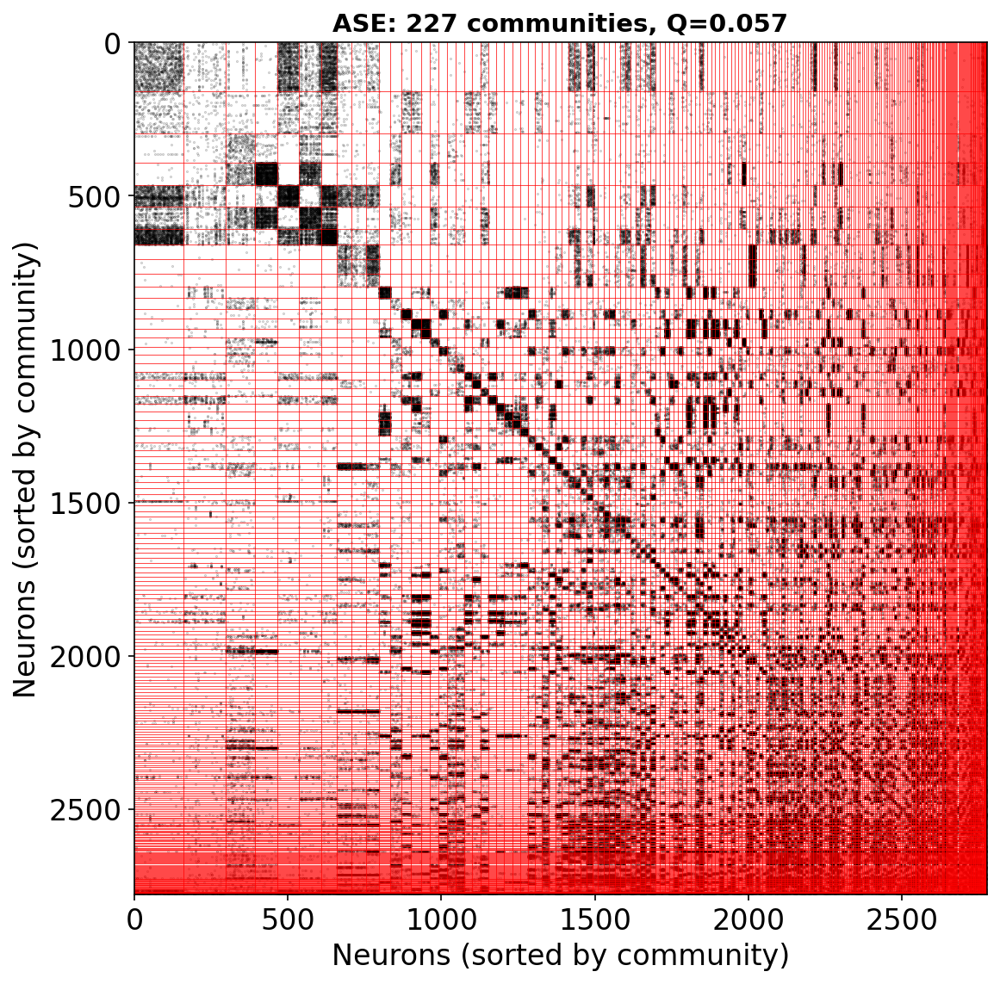

✓ Saved: imgs/fig_connectome_ase.png


In [62]:
# [FIGURE] ASE: Adjacency matrix sorted by community
if GRASPOLOGIC_AVAILABLE and 'ase_comms' in dir():
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))

    # Sort nodes by community (largest communities first)
    sorted_communities = sorted(enumerate(ase_comms), key=lambda x: -len(x[1]))
    ordered_nodes = []
    for _, comm in sorted_communities:
        ordered_nodes.extend(sorted(list(comm)))

    # Create reordered adjacency matrix
    node_idx_map = {n: i for i, n in enumerate(connectome_nodes)}
    order = [node_idx_map[n] for n in ordered_nodes]
    A_reordered = A_connectome[np.ix_(order, order)]

    # Plot as sparse matrix
    rows, cols = np.nonzero(A_reordered)
    ax.scatter(cols, rows, s=0.1, c='black', alpha=0.3)
    ax.set_xlim(-0.5, len(ordered_nodes)-0.5)
    ax.set_ylim(len(ordered_nodes)-0.5, -0.5)

    # Add community boundaries
    cumsum = 0
    for i, (_, comm) in enumerate(sorted_communities[:-1]):  # Skip last community
        cumsum += len(comm)
        ax.axhline(y=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)
        ax.axvline(x=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)

    ax.set_title(f'ASE: {len(ase_comms)} communities, Q={ase_Q:.3f}', fontsize=14, fontweight='bold')
    ax.set_xlabel('Neurons (sorted by community)')
    ax.set_ylabel('Neurons (sorted by community)')
    ax.set_aspect('equal')

    plt.tight_layout()
    plt.savefig('imgs/fig_connectome_ase.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('✓ Saved: imgs/fig_connectome_ase.png')
else:
    print('⚠️ ASE skipped (graspologic not available)')

In [63]:
# ═══════════════════════════════════════════════════════════════════════════════
# Run LSE on connectome
# ═══════════════════════════════════════════════════════════════════════════════
if GRASPOLOGIC_AVAILABLE:
    print('LSE: FAFB Central Complex Connectome')
    print('=' * 60)

    lse_comms, lse_Q, lse_info = run_lse(G_connectome, A=A_connectome, 
                                          n_clusters=SPECTRAL_N_CLUSTERS, verbose=True)

    # Add to results DataFrame
    sizes = sorted([len(c) for c in lse_comms], reverse=True)
    results_df.loc[len(results_df)] = ['LSE+kmeans', len(lse_comms), lse_Q,
                                        sizes[0], sizes[-1], lse_info['time']]

    # Store communities as node attribute
    node_to_comm = {}
    for comm_id, comm in enumerate(lse_comms):
        for node in comm:
            node_to_comm[node] = comm_id
    nx.set_node_attributes(G_connectome, node_to_comm, 'community_lse')

    print(f'\n✓ Community labels stored as node attribute: community_lse')
else:
    print('⚠️ graspologic not available - skipping LSE')

LSE: FAFB Central Complex Connectome
LSE (components=auto → 14, clusters=227, form=DAD, normalization=pass_to_ranks)
  Communities: 227, Q=0.047, Time: 28.8s
  Embedding shape: (2779, 14)

✓ Community labels stored as node attribute: community_lse


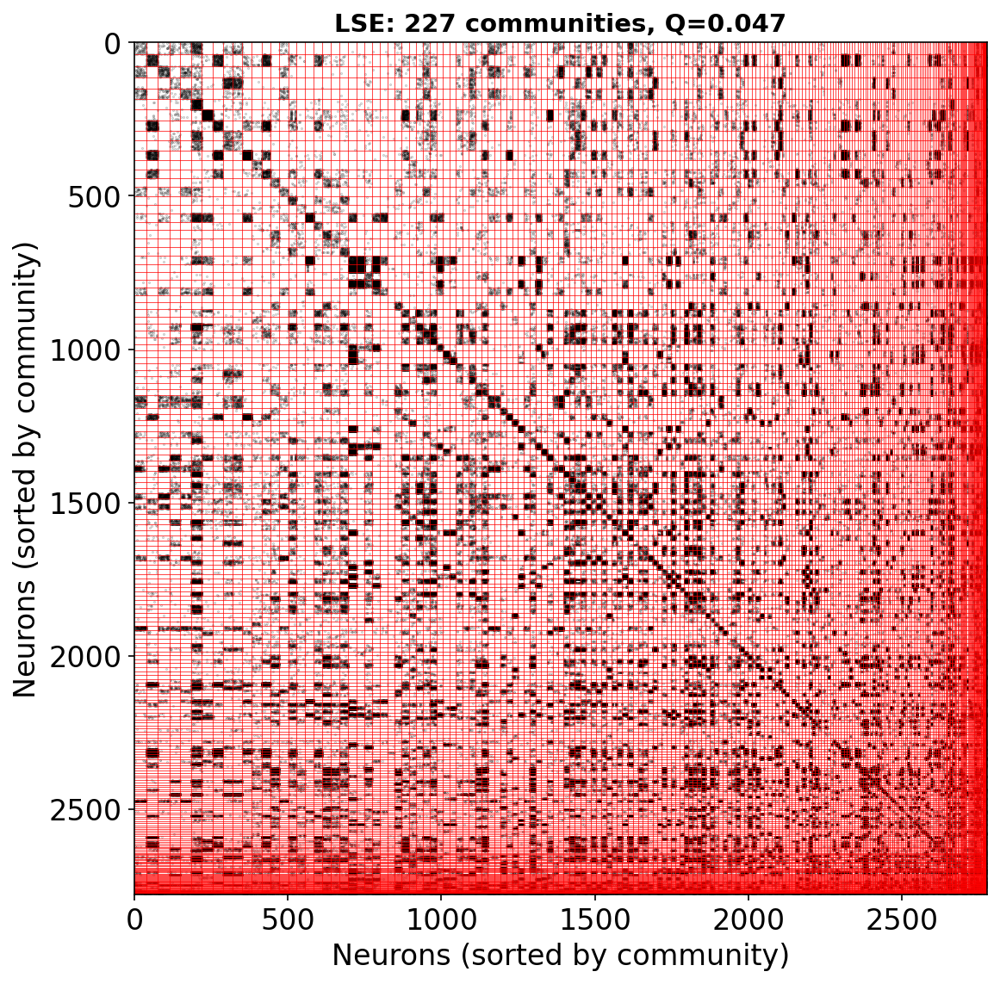

✓ Saved: imgs/fig_connectome_lse.png


In [64]:
# [FIGURE] LSE: Adjacency matrix sorted by community
if GRASPOLOGIC_AVAILABLE and 'lse_comms' in dir():
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))

    # Sort nodes by community (largest communities first)
    sorted_communities = sorted(enumerate(lse_comms), key=lambda x: -len(x[1]))
    ordered_nodes = []
    for _, comm in sorted_communities:
        ordered_nodes.extend(sorted(list(comm)))

    # Create reordered adjacency matrix
    node_idx_map = {n: i for i, n in enumerate(connectome_nodes)}
    order = [node_idx_map[n] for n in ordered_nodes]
    A_reordered = A_connectome[np.ix_(order, order)]

    # Plot as sparse matrix
    rows, cols = np.nonzero(A_reordered)
    ax.scatter(cols, rows, s=0.1, c='black', alpha=0.3)
    ax.set_xlim(-0.5, len(ordered_nodes)-0.5)
    ax.set_ylim(len(ordered_nodes)-0.5, -0.5)

    # Add community boundaries
    cumsum = 0
    for i, (_, comm) in enumerate(sorted_communities[:-1]):  # Skip last community
        cumsum += len(comm)
        ax.axhline(y=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)
        ax.axvline(x=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)

    ax.set_title(f'LSE: {len(lse_comms)} communities, Q={lse_Q:.3f}', fontsize=14, fontweight='bold')
    ax.set_xlabel('Neurons (sorted by community)')
    ax.set_ylabel('Neurons (sorted by community)')
    ax.set_aspect('equal')

    plt.tight_layout()
    plt.savefig('imgs/fig_connectome_lse.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('✓ Saved: imgs/fig_connectome_lse.png')
else:
    print('⚠️ LSE skipped (graspologic not available)')

In [65]:
# ═══════════════════════════════════════════════════════════════════════════════
# EXERCISE: Use GMM instead of K-means for spectral clustering
# ═══════════════════════════════════════════════════════════════════════════════
# Gaussian Mixture Models (GMM) can capture more complex cluster shapes than K-means.
# GMM also provides soft assignments (probabilities) rather than hard cluster labels.
#
# TODO: Modify the run_ase or run_lse function to use GMM instead of K-means:
#
# from sklearn.mixture import GaussianMixture
#
# def run_ase_gmm(G, A=None, n_clusters=SPECTRAL_N_CLUSTERS, n_components=SPECTRAL_N_COMPONENTS,
#                 n_elbows=SPECTRAL_N_ELBOWS, seed=RANDOM_SEED, verbose=True):
#     """ASE with GMM clustering instead of K-means."""
#     if not GRASPOLOGIC_AVAILABLE:
#         raise ImportError("graspologic not available")
#     
#     node_list = list(G.nodes())
#     if A is None:
#         A = nx.adjacency_matrix(G, nodelist=node_list).toarray().astype(float)
#     
#     # Apply pass-to-ranks normalization
#     A_ptr = pass_to_ranks(A)
#     
#     G_undirected = G.to_undirected() if G.is_directed() else G
#     
#     start = time.time()
#     
#     ase = AdjacencySpectralEmbed(n_components=n_components, n_elbows=n_elbows, svd_seed=seed)
#     embedding = ase.fit_transform(A_ptr)
#     
#     if isinstance(embedding, tuple):
#         embedding = np.concatenate(embedding, axis=1)
#     
#     # Use GMM instead of K-means
#     k = n_clusters or 4
#     gmm = GaussianMixture(n_components=k, random_state=seed, n_init=10)
#     labels = gmm.fit_predict(embedding)
#     
#     # Convert to communities
#     communities = [set() for _ in range(k)]
#     for idx, label in enumerate(labels):
#         communities[label].add(node_list[idx])
#     communities = [c for c in communities if len(c) > 0]
#     
#     Q = nx.community.modularity(G_undirected, communities)
#     elapsed = time.time() - start
#     
#     if verbose:
#         print(f'ASE+GMM (clusters={k})')
#         print(f'  Communities: {len(communities)}, Q={Q:.3f}, Time: {elapsed:.1f}s')
#     
#     return communities, Q, {'time': elapsed}
#
# # Run and compare:
# # ase_gmm_comms, ase_gmm_Q, _ = run_ase_gmm(G_connectome, A=A_connectome, n_clusters=n_clusters_spectral)

print('Exercise: Uncomment the code above to implement GMM-based spectral clustering')
print('Compare the results with K-means clustering - does GMM find different communities?')

Exercise: Uncomment the code above to implement GMM-based spectral clustering
Compare the results with K-means clustering - does GMM find different communities?


# PART 5: COMPARING ALL METHODS

Now let's compare the results from all methods we've run.

## 5.1 Evaluation Metrics

**Notation:** $C$ = ground truth classes, $K$ = predicted clusters, $H(\cdot)$ = entropy, $n_{ij}$ = contingency table

| Metric | Formula | Interpretation |
|--------|---------|----------------|
| **ARI** | $$\frac{RI - E[RI]}{\max(RI) - E[RI]}$$ | Adjusted Rand Index |
| **NMI** | $$\frac{MI(C, K)}{\sqrt{H(C) \cdot H(K)}}$$ | Normalized mutual information |
| **Homogeneity** | $$H = 1 - \frac{H(C\|K)}{H(C)}$$ | Each cluster contains only one class |
| **Completeness** | $$C = 1 - \frac{H(K\|C)}{H(K)}$$ | All members of a class are in same cluster |
| **V-measure** | $$V = 2 \cdot \frac{H \cdot C}{H + C}$$ | Harmonic mean of H and C |

\* $RI = \frac{TP + TN}{TP + TN + FP + FN}$

- ARI/NMI are **chance-adjusted** (0 = random, 1 = perfect)
- Homogeneity + Completeness decompose V-measure

## 5.2 Results Summary

All methods have been run. Let's compare their performance.

In [66]:
# ═══════════════════════════════════════════════════════════════════════════════
# Add evaluation metrics (ARI, NMI, etc.) to results_df
# ═══════════════════════════════════════════════════════════════════════════════
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from sklearn.metrics import adjusted_mutual_info_score, v_measure_score, homogeneity_score, completeness_score
from collections import Counter

# Get ground truth cell types
cell_types = nx.get_node_attributes(G_connectome, 'cell_type')
ground_truth = [cell_types[n] for n in connectome_nodes]
n_cell_types = len(set(ground_truth))

# Collect all community assignments for evaluation
all_community_labels = {}

# Convert community lists to node labels
def comms_to_labels(comms, nodes):
    """Convert list of community sets to per-node labels."""
    node_to_label = {}
    for comm_id, comm in enumerate(comms):
        for node in comm:
            node_to_label[node] = comm_id
    return [node_to_label.get(n, -1) for n in nodes]

# Louvain
all_community_labels['Louvain'] = comms_to_labels(louvain_comms, connectome_nodes)

# Leiden
if GRASPOLOGIC_AVAILABLE and leiden_comms is not None:
    all_community_labels['Leiden'] = comms_to_labels(leiden_comms, connectome_nodes)

# SBM variants
if GRAPH_TOOL_AVAILABLE and 'sbm_results' in dir():
    for sbm_name, sbm_res in sbm_results.items():
        all_community_labels[sbm_name] = comms_to_labels(sbm_res['comms'], connectome_nodes)

# ASE
if GRASPOLOGIC_AVAILABLE and 'ase_comms' in dir():
    all_community_labels['ASE+kmeans'] = comms_to_labels(ase_comms, connectome_nodes)

# LSE
if GRASPOLOGIC_AVAILABLE and 'lse_comms' in dir():
    all_community_labels['LSE+kmeans'] = comms_to_labels(lse_comms, connectome_nodes)

# Compute metrics for each method and add to results_df
results_df['ARI'] = np.nan
results_df['NMI'] = np.nan
results_df['AMI'] = np.nan
results_df['V-measure'] = np.nan
results_df['Homogeneity'] = np.nan
results_df['Completeness'] = np.nan

for method, pred_labels in all_community_labels.items():
    ari = adjusted_rand_score(ground_truth, pred_labels)
    nmi = normalized_mutual_info_score(ground_truth, pred_labels)
    ami = adjusted_mutual_info_score(ground_truth, pred_labels)
    v_measure = v_measure_score(ground_truth, pred_labels)
    homogeneity = homogeneity_score(ground_truth, pred_labels)
    completeness = completeness_score(ground_truth, pred_labels)
    
    # Update results_df
    mask = results_df['Method'] == method
    if mask.any():
        results_df.loc[mask, 'ARI'] = ari
        results_df.loc[mask, 'NMI'] = nmi
        results_df.loc[mask, 'AMI'] = ami
        results_df.loc[mask, 'V-measure'] = v_measure
        results_df.loc[mask, 'Homogeneity'] = homogeneity
        results_df.loc[mask, 'Completeness'] = completeness

# Sort by ARI
results_df = results_df.sort_values('ARI', ascending=False).reset_index(drop=True)

# Display results
print('COMMUNITY DETECTION RESULTS')
print(f'Ground truth: {n_cell_types} unique cell types')
print('=' * 140)
print(f"{'Method':<18} {'Comms':>8} {'Q':>10} {'ARI':>8} {'NMI':>8} {'AMI':>8} {'V-meas':>8} {'Homog':>8} {'Compl':>8}")
print('-' * 140)
for _, row in results_df.iterrows():
    Q_str = f"{row['Modularity']:.4f}" if not np.isnan(row['Modularity']) else 'N/A'
    ari_str = f"{row['ARI']:.4f}" if not np.isnan(row['ARI']) else 'N/A'
    nmi_str = f"{row['NMI']:.4f}" if not np.isnan(row['NMI']) else 'N/A'
    vm_str = f"{row['V-measure']:.4f}" if not np.isnan(row['V-measure']) else 'N/A'
    hom_str = f"{row['Homogeneity']:.4f}" if not np.isnan(row['Homogeneity']) else 'N/A'
    comp_str = f"{row['Completeness']:.4f}" if not np.isnan(row['Completeness']) else 'N/A'
    print(f"{row['Method']:<18} {row['Communities']:>8} {Q_str:>10} {ari_str:>8} {nmi_str:>8} {vm_str:>8} {hom_str:>8} {comp_str:>8}")
print('=' * 140)

# Highlight best methods
valid_ari = results_df[results_df['ARI'].notna()]
if len(valid_ari) > 0:
    best_ari_idx = valid_ari['ARI'].idxmax()
    best_ari_method = results_df.loc[best_ari_idx, 'Method']
    best_ari = results_df.loc[best_ari_idx, 'ARI']
    
    best_nmi_idx = valid_ari['NMI'].idxmax()
    best_nmi_method = results_df.loc[best_nmi_idx, 'Method']
    best_nmi = results_df.loc[best_nmi_idx, 'NMI']
    
    print(f'\nBest by ARI (cell type agreement): {best_ari_method} (ARI = {best_ari:.4f})')
    print(f'Best by NMI (mutual information):  {best_nmi_method} (NMI = {best_nmi:.4f})')

valid_Q = results_df[results_df['Modularity'].notna()]
if len(valid_Q) > 0:
    best_Q_idx = valid_Q['Modularity'].idxmax()
    best_Q_method = results_df.loc[best_Q_idx, 'Method']
    best_Q = results_df.loc[best_Q_idx, 'Modularity']
    print(f'Best by Modularity:                {best_Q_method} (Q = {best_Q:.4f})')

print(f'\nNote: Homogeneity = each cluster contains only one cell type; Completeness = all members of a cell type are in same cluster')

COMMUNITY DETECTION RESULTS
Ground truth: 227 unique cell types
Method                Comms          Q      ARI      NMI      AMI   V-meas    Homog    Compl
--------------------------------------------------------------------------------------------------------------------------------------------
SBM                     105     0.1108   0.5245   0.8540   0.8540   0.8258   0.8842
ASE+kmeans              227     0.0566   0.4815   0.8265   0.8265   0.8354   0.8179
LSE+kmeans              227     0.0469   0.3586   0.8289   0.8289   0.8648   0.7958
Louvain                  10     0.5473   0.1635   0.5304   0.5304   0.3735   0.9149
Leiden                    9     0.5571   0.1347   0.5032   0.5032   0.3452   0.9278

Best by ARI (cell type agreement): SBM (ARI = 0.5245)
Best by NMI (mutual information):  SBM (NMI = 0.8540)
Best by Modularity:                Leiden (Q = 0.5571)

Note: Homogeneity = each cluster contains only one cell type; Completeness = all members of a cell type are in same c

In [67]:
# [FIGURE] Sankey Diagrams: Community Assignments vs Ground Truth Cell Types
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# First, establish a consistent ordering of cell types across all methods
# Sort by frequency (least common first, most common last)
type_counts_global = Counter([t for t in ground_truth if t is not None])
sorted_cell_types = [t for t, _ in reversed(type_counts_global.most_common())]
cell_type_to_order = {t: i for i, t in enumerate(sorted_cell_types)}

# Fixed type labels for ALL methods (consistent order)
fixed_type_labels = sorted_cell_types + ['Unknown']

def create_sankey_ordered(pred_labels, ground_truth, method_name, cell_type_order, fixed_type_labels):
    """
    Create a Sankey diagram with consistent ordering.
    
    - Cell types (right) are ordered by global frequency (fixed across all methods)
    - Communities (left) are sorted by their dominant cell type
    """
    # Count flows from each community to each cell type
    comm_to_types = {}
    for pred, gt in zip(pred_labels, ground_truth):
        if pred not in comm_to_types:
            comm_to_types[pred] = Counter()
        type_label = gt if gt is not None else '__Unknown__'
        comm_to_types[pred][type_label] += 1
    
    # For each community, find its dominant (most common) cell type
    comm_dominant_type = {}
    for comm, type_counter in comm_to_types.items():
        # Get the most common non-Unknown type
        for t, _ in type_counter.most_common():
            if t != '__Unknown__' and t in cell_type_order:
                comm_dominant_type[comm] = t
                break
        else:
            # If only Unknown, assign to end
            comm_dominant_type[comm] = 'Unknown'
    
    # Sort communities by their dominant type's order
    def comm_sort_key(c):
        dom_type = comm_dominant_type.get(c, 'Unknown')
        if dom_type == 'Unknown':
            return (len(cell_type_order) + 1, 0)
        return (cell_type_order.get(dom_type, len(cell_type_order)), -comm_to_types[c].get(dom_type, 0))
    
    sorted_comms = sorted(comm_to_types.keys(), key=comm_sort_key)
    
    # Build ordered labels
    comm_labels = [f'C{c}' for c in sorted_comms]
    n_comms = len(comm_labels)
    
    # Create flow data
    flows = {}
    for pred, gt in zip(pred_labels, ground_truth):
        comm_label = f'C{pred}'
        type_label = gt if gt is not None else 'Unknown'
        key = (comm_label, type_label)
        flows[key] = flows.get(key, 0) + 1
    
    # Use fixed type labels for consistent display across methods
    all_labels = comm_labels + fixed_type_labels
    label_to_idx = {label: i for i, label in enumerate(all_labels)}
    
    # Create source, target, value lists
    sources = []
    targets = []
    values = []
    
    for (comm, cell_type), count in flows.items():
        if comm in label_to_idx and cell_type in label_to_idx:
            sources.append(label_to_idx[comm])
            targets.append(label_to_idx[cell_type])
            values.append(count)
    
    # Colors: communities in blues, cell types in greens
    colors = ['rgba(31, 119, 180, 0.8)'] * n_comms + ['rgba(44, 160, 44, 0.8)'] * len(fixed_type_labels)
    
    return {
        'labels': all_labels,
        'sources': sources,
        'targets': targets,
        'values': values,
        'colors': colors,
        'n_comms': len(set(pred_labels)),
        'n_types': len([t for t in fixed_type_labels if t != 'Unknown'])
    }

# Select methods to compare
methods_to_plot = ['Louvain', 'Leiden', 'SBM', 'DC-SBM', 'Nested DC-SBM', 'ASE+kmeans', 'LSE+kmeans']
methods_available = [m for m in methods_to_plot if m in all_community_labels]

# Create subplots - one Sankey per method
n_plots = len(methods_available)
fig = make_subplots(
    rows=1, cols=n_plots,
    subplot_titles=[f'{m}' for m in methods_available],
    specs=[[{'type': 'sankey'}] * n_plots],
    horizontal_spacing=0.03
)

for idx, method in enumerate(methods_available):
    pred_labels = all_community_labels[method]
    sankey_data = create_sankey_ordered(pred_labels, ground_truth, method, cell_type_to_order, fixed_type_labels)
    
    # Get ARI/NMI for subtitle
    method_row = results_df[results_df['Method'] == method]
    ari = method_row['ARI'].values[0] if len(method_row) > 0 else 0
    nmi = method_row['NMI'].values[0] if len(method_row) > 0 else 0
    
    fig.add_trace(
        go.Sankey(
            node=dict(
                pad=2,
                thickness=10,
                line=dict(color='black', width=0.3),
                label=sankey_data['labels'],
                color=sankey_data['colors']
            ),
            link=dict(
                source=sankey_data['sources'],
                target=sankey_data['targets'],
                value=sankey_data['values'],
                color='rgba(150, 150, 150, 0.2)'
            )
        ),
        row=1, col=idx+1
    )
    
    # Update subplot title with metrics
    fig.layout.annotations[idx].text = f'{method}<br><sup>ARI={ari:.3f}, NMI={nmi:.3f}, K={sankey_data["n_comms"]}</sup>'

n_unique_types = len(sorted_cell_types)
fig.update_layout(
    title=dict(
        text=f'Community Detection vs Ground Truth ({n_unique_types} Cell Types)<br><sup>Left: Communities (sorted by dominant cell type) → Right: Cell Types (sorted least→most abundant)</sup>',
        x=0.5,
        font=dict(size=16)
    ),
    height=1800,
    width=600 * n_plots,
    font=dict(size=8)
)

fig.show()

# Save as HTML for interactivity
fig.write_html('imgs/fig_sankey_community_comparison.html')
print(f'✓ Saved: imgs/fig_sankey_community_comparison.html')
print(f'  Cell types: sorted by global frequency (least→most abundant, same order across all methods)')
print(f'  Communities: sorted by dominant cell type')

✓ Saved: imgs/fig_sankey_community_comparison.html
  Cell types: sorted by global frequency (least→most abundant, same order across all methods)
  Communities: sorted by dominant cell type


Generating community comparison visualizations...


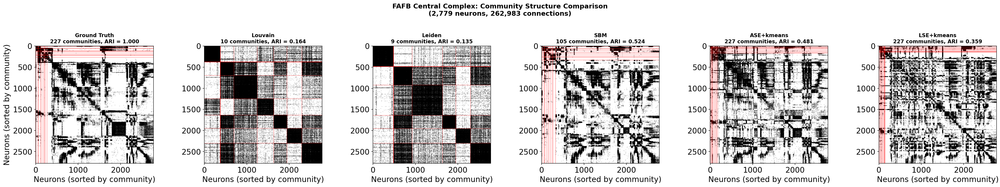

✓ Saved: imgs/fig_connectome_communities_comparison.png


In [68]:
# [FIGURE] Visualize connectome communities - Adjacency Matrix Comparison
print('Generating community comparison visualizations...')

from scipy.optimize import linear_sum_assignment

# Get ground truth cell types for alignment
cell_types = nx.get_node_attributes(G_connectome, 'cell_type')

# Create ground truth communities (sets of nodes per cell type)
# Sort by (cell_type, node_id) to match the earlier figure
gt_type_to_nodes = {}
for node, ctype in cell_types.items():
    if ctype not in gt_type_to_nodes:
        gt_type_to_nodes[ctype] = set()
    gt_type_to_nodes[ctype].add(node)

# Sort ground truth communities by cell type name (alphabetically) for consistent ordering
sorted_gt_types = sorted(gt_type_to_nodes.keys())
ground_truth_comms = [gt_type_to_nodes[t] for t in sorted_gt_types]

def align_communities_to_ground_truth(detected_comms, gt_comms):
    """
    Align detected communities to ground truth using the Hungarian algorithm.
    Returns communities reordered to best match ground truth ordering.
    """
    n_detected = len(detected_comms)
    n_gt = len(gt_comms)
    
    # Build overlap matrix: overlap[i,j] = |detected_i ∩ gt_j|
    overlap = np.zeros((n_detected, n_gt))
    for i, det_comm in enumerate(detected_comms):
        for j, gt_comm in enumerate(gt_comms):
            overlap[i, j] = len(det_comm & gt_comm)
    
    # Solve assignment problem (maximize overlap = minimize negative overlap)
    row_ind, col_ind = linear_sum_assignment(-overlap)
    
    # Create mapping from detected community index to ground truth order
    # Communities matched to GT get their GT index; unmatched get placed at end
    comm_order = {}
    for det_idx, gt_idx in zip(row_ind, col_ind):
        comm_order[det_idx] = gt_idx
    
    # Assign remaining communities (if more detected than GT) to end positions
    next_pos = n_gt
    for i in range(n_detected):
        if i not in comm_order:
            comm_order[i] = next_pos
            next_pos += 1
    
    # Sort communities by their assigned order
    sorted_comms = sorted(enumerate(detected_comms), key=lambda x: comm_order[x[0]])
    return [comm for _, comm in sorted_comms]

# Collect all community results (only non-degenerate ones)
all_communities = {
    'Louvain': louvain_comms,
}

if GRASPOLOGIC_AVAILABLE and leiden_comms is not None:
    all_communities['Leiden'] = leiden_comms
if GRAPH_TOOL_AVAILABLE and 'sbm_results' in dir():
    all_communities['SBM'] = sbm_results['SBM']['comms']
if GRASPOLOGIC_AVAILABLE and 'ase_comms' in dir():
    all_communities['ASE+kmeans'] = ase_comms
if GRASPOLOGIC_AVAILABLE and 'lse_comms' in dir():
    all_communities['LSE+kmeans'] = lse_comms

# Add ground truth as first entry
all_communities_with_gt = {'Ground Truth': ground_truth_comms}
all_communities_with_gt.update(all_communities)

n_methods = len(all_communities_with_gt)
fig, axes = plt.subplots(1, n_methods, figsize=(5*n_methods, 5))
if n_methods == 1:
    axes = [axes]

for idx, (method, comms) in enumerate(all_communities_with_gt.items()):
    ax = axes[idx]
    
    if method == 'Ground Truth':
        # Ground truth is already sorted by cell type name
        aligned_comms = comms
        ARI = 1.0  # Perfect match with itself
        
        # Order nodes by (cell_type, node_id) to match original figure
        ordered_nodes = []
        for comm in aligned_comms:
            ordered_nodes.extend(sorted(list(comm)))
    else:
        # Get ARI from results
        ARI_row = results_df[results_df['Method'] == method]['ARI']
        ARI = ARI_row.values[0] if len(ARI_row) > 0 else np.nan
        # Align communities to ground truth using linear assignment
        aligned_comms = align_communities_to_ground_truth(comms, ground_truth_comms)
        
        # Order nodes by aligned communities
        ordered_nodes = []
        for comm in aligned_comms:
            ordered_nodes.extend(sorted(list(comm)))
    
    # Create reordered adjacency matrix
    node_idx_map = {n: i for i, n in enumerate(connectome_nodes)}
    order = [node_idx_map[n] for n in ordered_nodes]
    A_reordered = A_connectome[np.ix_(order, order)]
    
    # Plot as sparse matrix (only show nonzero entries)
    rows, cols = np.nonzero(A_reordered)
    ax.scatter(cols, rows, s=0.1, c='black', alpha=0.3)
    ax.set_xlim(-0.5, len(ordered_nodes)-0.5)
    ax.set_ylim(len(ordered_nodes)-0.5, -0.5)
    
    # Add community boundaries for top 10 communities
    cumsum = 0
    for i, comm in enumerate(aligned_comms[:10]):
        cumsum += len(comm)
        ax.axhline(y=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)
        ax.axvline(x=cumsum-0.5, color='red', linewidth=0.5, alpha=0.7)
    
    ARI_str = f'{ARI:.3f}' if not np.isnan(ARI) else 'N/A'
    ax.set_title(f'{method}\n{len(comms)} communities, ARI = {ARI_str}', fontsize=11, fontweight='bold')
    ax.set_xlabel('Neurons (sorted by community)')
    if idx == 0:
        ax.set_ylabel('Neurons (sorted by community)')
    ax.set_aspect('equal')

plt.suptitle(f'FAFB Central Complex: Community Structure Comparison\n({G_connectome.number_of_nodes():,} neurons, {G_connectome.number_of_edges():,} connections)',
             fontsize=14, fontweight='bold', y=1.05)
plt.tight_layout()
plt.savefig('imgs/fig_connectome_communities_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print('✓ Saved: imgs/fig_connectome_communities_comparison.png')


In [69]:
# Interactive visualization using ipysigma
# Available community labels: community_louvain, community_leiden, community_sbm, community_ase, community_lse
# Color by Louvain community, size by degree
if IPYSIGMA_AVAILABLE:
    print('Interactive graph visualization (ipysigma)')
    print('Color: Louvain community | Size: node degree')
    print('Click the play button to start ForceAtlas2 layout algorithm')
    display(visualize_graph(G_connectome, 
                           node_color_attr='community_lse',
                           node_size_attr='degree',
                           height=700))
else:
    print('⚠️ ipysigma not available for interactive visualization')
    print('   Install with: pip install ipysigma')

Interactive graph visualization (ipysigma)
Color: Louvain community | Size: node degree
Click the play button to start ForceAtlas2 layout algorithm


Sigma(nx.DiGraph with 2,779 nodes and 262,983 edges)

Adjacency matrix (matplotlib)
Sorted by Louvain community membership


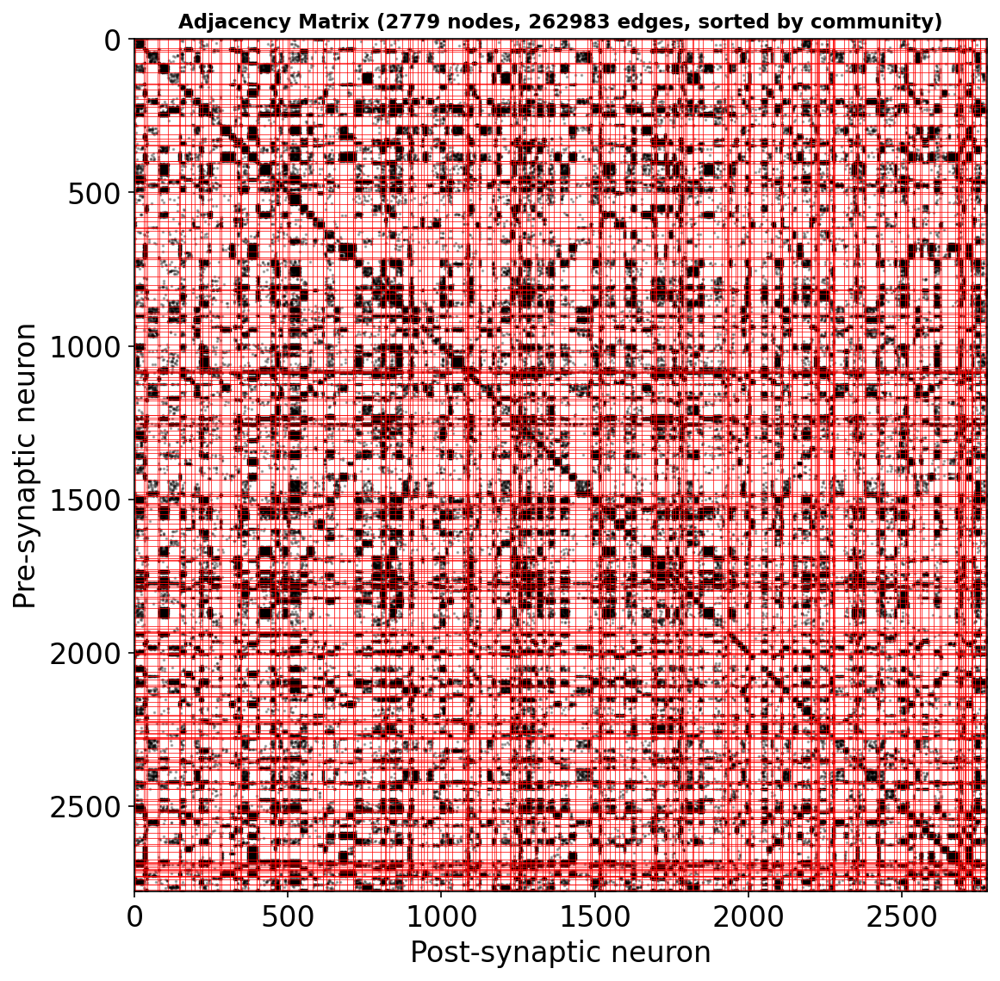

In [70]:
# Adjacency matrix visualization using matplotlib
# Sorted by Louvain community
print('Adjacency matrix (matplotlib)')
print('Sorted by Louvain community membership')

plot_adjacency_matrix(G_connectome, 
                     sort_by='community',
                     community_attr='community_lse',
                     marker_size=0.5);

# PART 6: SUMMARY

## Method Comparison

| Method | Pros | Cons |
|--------|------|------|
| **Louvain/Leiden** | Fast, intuitive Q score | ! Assortative only |
| **SBM (inferential)** | Direct inference | Slower, requires graph-tool |
| **ASE/LSE** | Interpretable embedding | Requires choosing d and k |

One word of caution - all suffers from curse of dimensionality